#Punto 1 y 2

In [6]:
# https://www.youtube.com/watch?v=538fs2aFYoU&ab_channel=ErikBojorges

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.decomposition import FastICA
from scipy.io import wavfile
import IPython.display as ipd # Para reproducir audio en el Jupyter Notebook


In [8]:
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (9, 7)

In [9]:
ipd.Audio("AudioAntro.wav")

In [10]:
fSonido, sonido = wavfile.read("AudioAntro.wav")

In [11]:
sonido.shape
# Solo vemos que tiene un señal

(880027, 2)

In [12]:
sonido.dtype

dtype('int16')

In [13]:
print(sonido)

[[ -29  -30]
 [ 872  872]
 [ 869  869]
 ...
 [-167 -169]
 [-111 -112]
 [ -49  -47]]


In [14]:
sonido[:,0]

array([ -29,  872,  869, ..., -167, -111,  -49], dtype=int16)

In [15]:
sonido[:,1]

array([ -30,  872,  869, ..., -169, -112,  -47], dtype=int16)

In [16]:
sonidoTransformado = sonido / 2.0**15
sonidoTransformado

array([[-0.00088501, -0.00091553],
       [ 0.02661133,  0.02661133],
       [ 0.02651978,  0.02651978],
       ...,
       [-0.00509644, -0.00515747],
       [-0.00338745, -0.00341797],
       [-0.00149536, -0.00143433]])

In [17]:
duracion = sonido.shape[0]/fSonido
print("Duracion",duracion)

Duracion 19.955260770975055


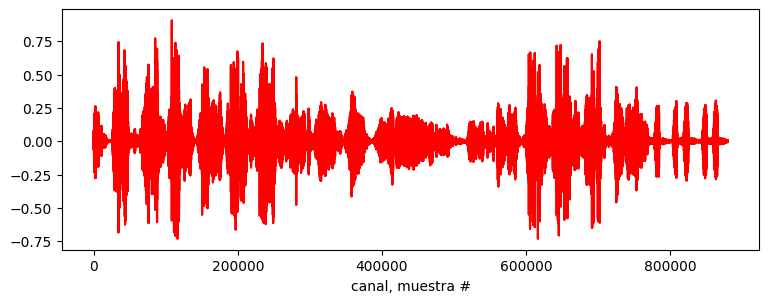

In [18]:
plt.subplot(2,1,1)
plt.plot(sonidoTransformado, 'r')
plt.xlabel("canal, muestra #")
plt.show()

In [19]:
print("Sonido",sonido.shape[0])
print("Sonido Tranformado",sonidoTransformado.shape[0])

Sonido 880027
Sonido Tranformado 880027


In [20]:
tiempo = np.linspace(0,duracion,sonido.shape[0])

Text(0, 0.5, 'señal, relative units')

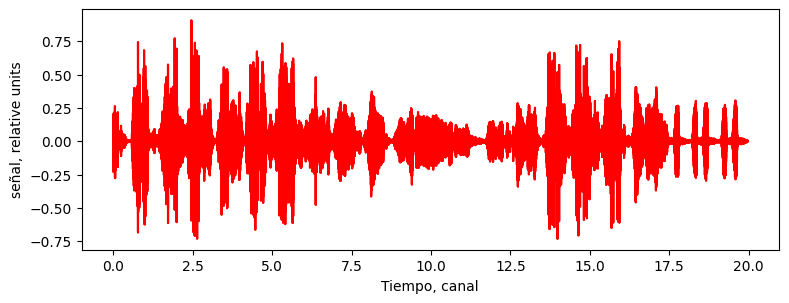

In [21]:
plt.subplot(2,1,1)
plt.plot(tiempo, sonidoTransformado, 'r')
plt.xlabel("Tiempo, canal")
plt.ylabel("señal, relative units")

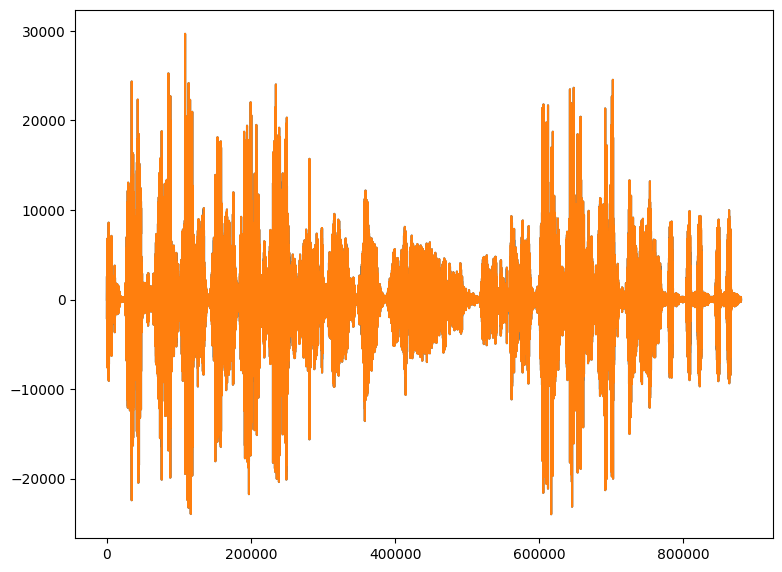

In [22]:
plt.plot(sonido)
plt.show()

s [[-0.01234567 -0.01277138]
 [ 0.37122158  0.37122152]
 [ 0.36994444  0.36994439]
 ...
 [-0.07109404 -0.07194546]
 [-0.04725412 -0.04767983]
 [-0.02085993 -0.0200085 ]]


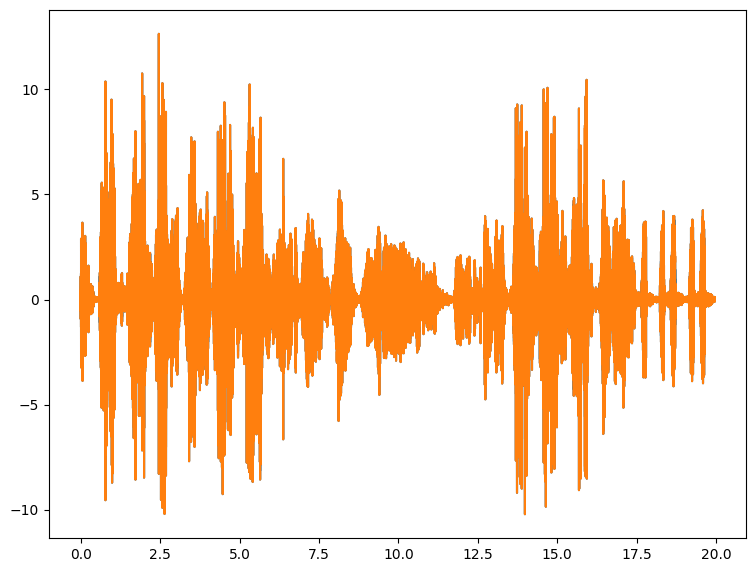

In [23]:
# Normalizamos la señal 
#acomoda los niveles de volumen lo sube o  baja depediendo
S = sonidoTransformado
S /= S.std(axis=0)
print("s",S)
plt.plot(tiempo,S)
plt.show()

In [24]:
ica = FastICA(n_components=2)
S_ = ica.fit_transform(S)
A_ = ica.mixing_

In [25]:
# aqui viene la señales, seran las misma cantidad que el numero de componente 
# que le indicamos al crear al algoritmo ICA
S_

array([[-3.60688549e-04,  1.33071314e-05],
       [-1.86270423e-08, -3.95684072e-04],
       [-1.88858004e-08, -3.94322658e-04],
       ...,
       [-7.21292659e-04,  7.60455133e-05],
       [-3.60695621e-04,  5.05190991e-05],
       [ 7.21086350e-04,  2.20431318e-05]])

In [26]:
# Matriz de transformacion 
A_

array([[-2.94919377e-01, -9.38097497e+02],
       [ 8.85674077e-01, -9.38097125e+02]])

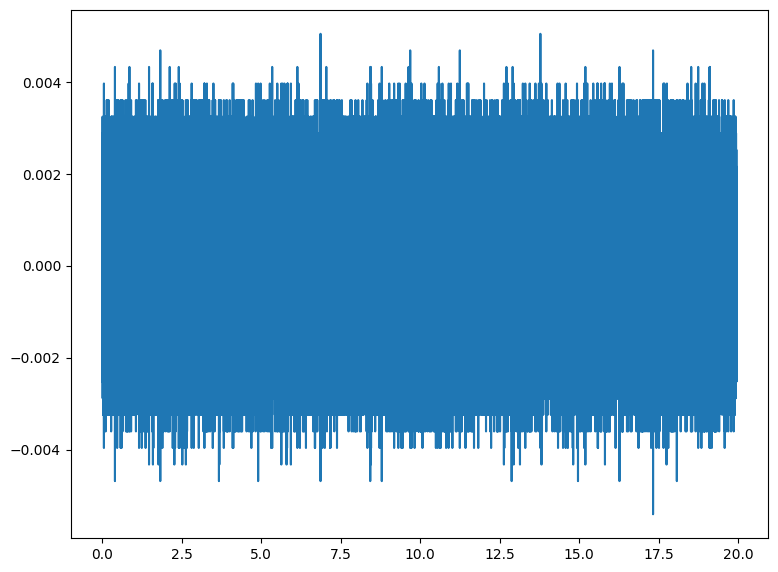

In [27]:
plt.plot(tiempo,S_[:,0])
plt.show()

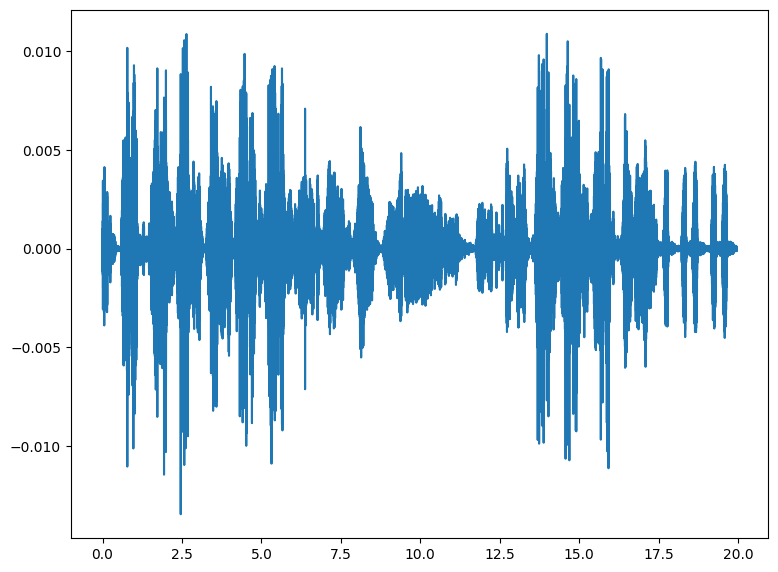

In [28]:
plt.plot(tiempo,S_[:,1])
plt.show()

In [29]:
ruido = S_[:,1]

In [30]:
# https://joserzapata.github.io/courses/mineria-audio/representacion_audio/

In [31]:
print (np.allclose(sonidoTransformado, np.dot(S_,A_.T)+ica.mean_))

True


In [32]:
ipd.Audio(S_[:,0], rate=fSonido)

In [33]:
ipd.Audio(S_[:,1], rate=fSonido)

#Funcion para obtener los arreglos de los audios 

In [42]:
import librosa
import librosa.display
from librosa import feature
sampling_rate=fSonido
# feature_1=np.mean(feature.chroma_stft(y=ruido, sr=sampling_rate))
features_func_list = [
    feature.chroma_stft,
    feature.spectral_centroid,
    feature.spectral_bandwidth,
    feature.spectral_rolloff
]


In [34]:
def graficarSonido(tiempo,sonidoTransformado):
  plt.subplot(2,1,1)
  plt.plot(tiempo, sonidoTransformado, 'r')
  plt.xlabel("Tiempo, canal")
  plt.ylabel("señal, relative units")
  plt.show()

In [35]:
def normalizacionSonido(sonidoTransformado):
  S = sonidoTransformado
  S /= S.std(axis=0)
  return S

In [46]:
# Se puede mejorar a un
def obtenerArreglosDeSonido(nombres):
  sonidos = []
  tiempos = []
  frecuencias = []
  for nombre in nombres:
    fSonido, sonido = wavfile.read(nombre)
    frecuencias.append(fSonido)
    sonidoTransformado = sonido / 2.0**15
    duracion = sonidoTransformado.shape[0]/fSonido
    tiempo = np.linspace(0,duracion,sonido.shape[0])
    tiempos.append(tiempo)
    graficarSonido(tiempo,sonidoTransformado)
    # realizamos normalizacion 
    S = normalizacionSonido(sonidoTransformado)
    ica = FastICA(n_components=2)
    S_ = ica.fit_transform(S)
    A_ = ica.mixing_
    sonidos.append(S_)
  return sonidos,tiempos,frecuencias
    

In [37]:
def obtenerCarecteristicaArreglo(arreglo):
  for x in range(len(arreglo)):
    print(f"Arreglo {x+1} shape de {arreglo[x].shape}")

In [38]:
def displaySonido(Sonidos,tiempo):
  # Por default sabemos que Sonido tiene dos componetes
  for x in range(len(Sonidos)):
    print(f"Indice de la lista {x}")
    print("\n")
    print(f"Señal en indice {0}")
    graficarSonido(tiempo[x],Sonidos[x][:,0])
    print("\n")
    print(f"Señal en indice {1}")
    graficarSonido(tiempo[x],Sonidos[x][:,1])



In [39]:
def ObtenerNuevasCarecteristicas(Sonidos,frecuencias):
  caracteristicas = []
  for x in range(len(Sonidos)):
    caracteristicas.append(get_audio_features(Sonidos[x],frecuencias[x]))
  return caracteristicas

In [43]:
def get_audio_features(audio, audio_sampling_rate):
    features_list = []
    for feature_function in features_func_list:
        features_list.append(np.mean(feature_function(y=audio, sr=audio_sampling_rate)))
    return features_list

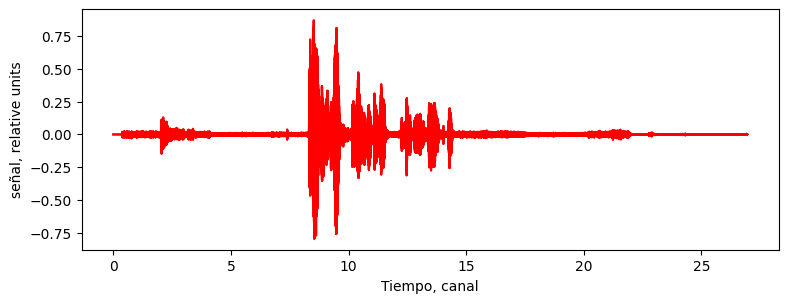

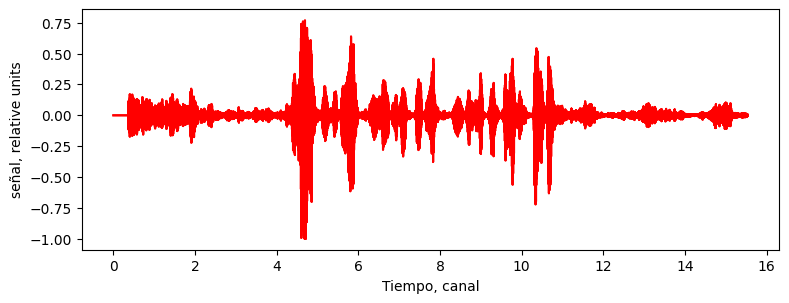

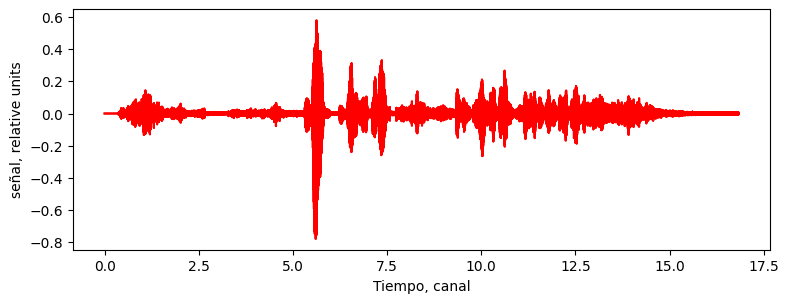

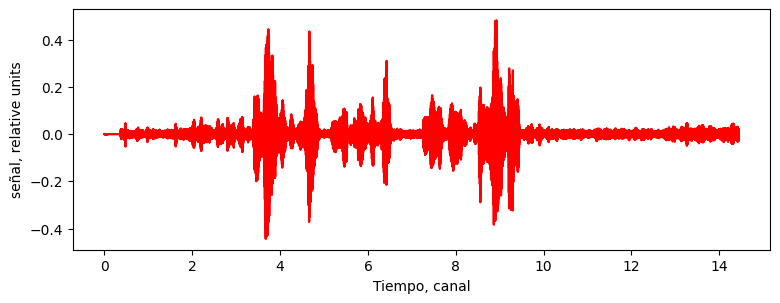

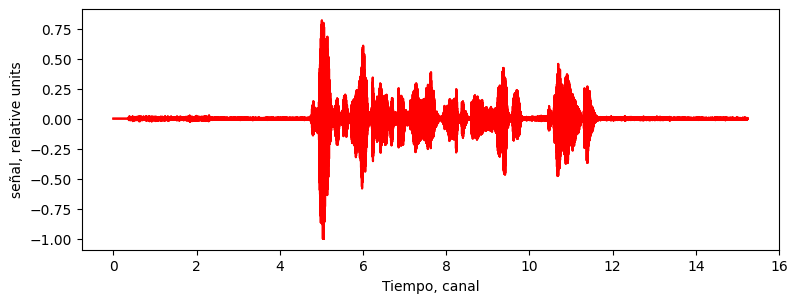

In [47]:
nombres = ["estadio1.wav","fiesta1.wav","playa1.wav","spa1.wav","tren1.wav"]
X,t,f = obtenerArreglosDeSonido(nombres)

In [48]:
obtenerCarecteristicaArreglo(X)

Arreglo 1 shape de (1188507, 2)
Arreglo 2 shape de (684827, 2)
Arreglo 3 shape de (742427, 2)
Arreglo 4 shape de (636827, 2)
Arreglo 5 shape de (672027, 2)


Indice de la lista 0


Señal en indice 0


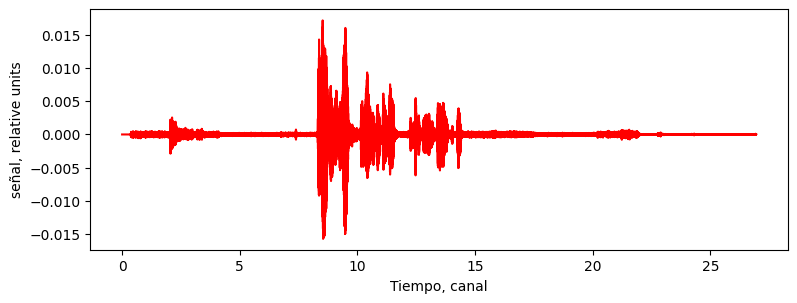



Señal en indice 1


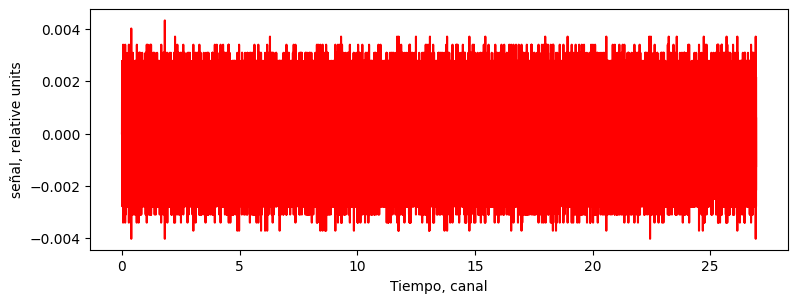

Indice de la lista 1


Señal en indice 0


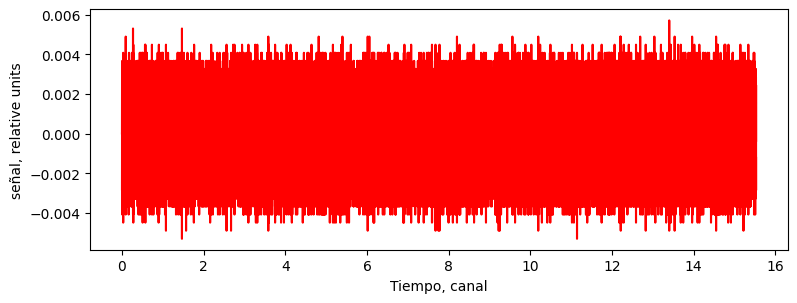



Señal en indice 1


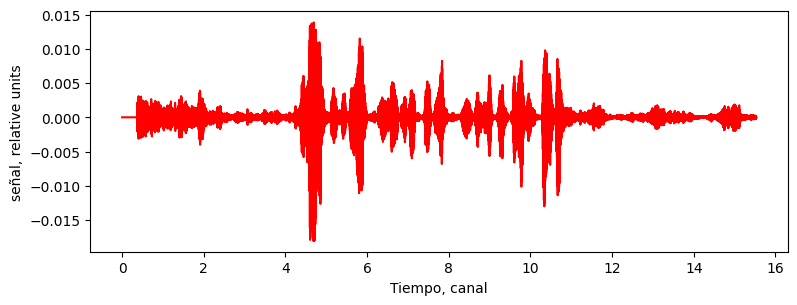

Indice de la lista 2


Señal en indice 0


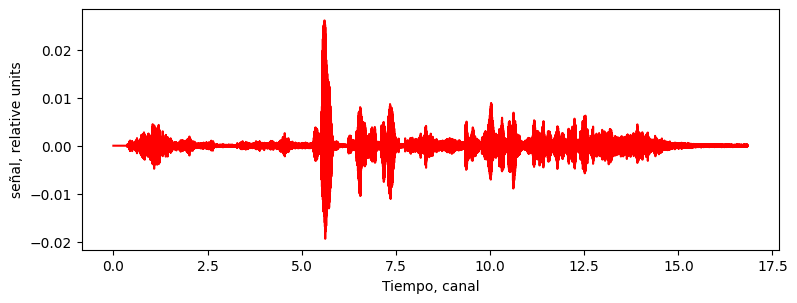



Señal en indice 1


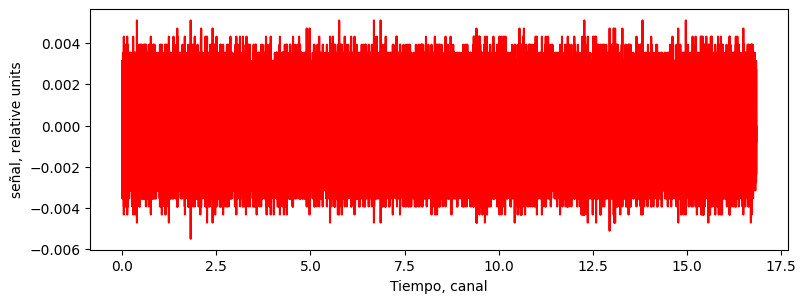

Indice de la lista 3


Señal en indice 0


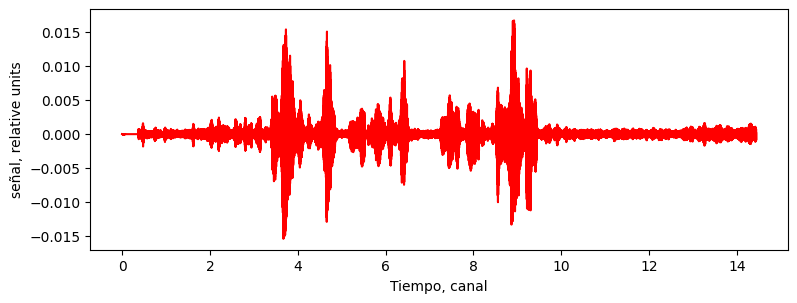



Señal en indice 1


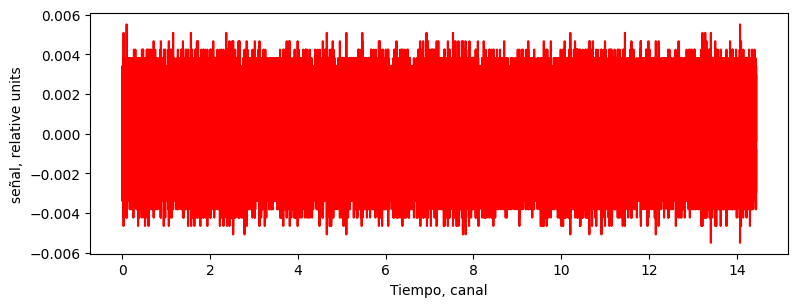

Indice de la lista 4


Señal en indice 0


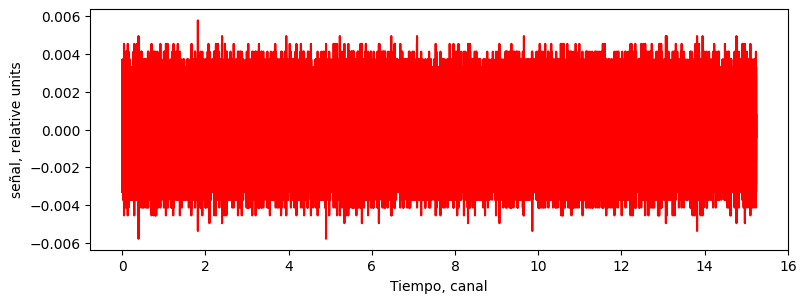



Señal en indice 1


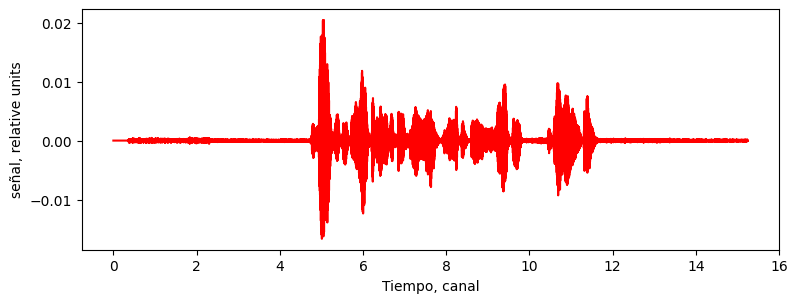

In [49]:
displaySonido(X,t)

In [50]:
arreglo = []
arreglo.append(X[0][:,1])
arreglo.append(X[1][:,0])
arreglo.append(X[2][:,1])
arreglo.append(X[3][:,1])
arreglo.append(X[4][:,0])

In [51]:
arreglo

[array([ 9.38733785e-09,  9.38733785e-09,  9.38733785e-09, ...,
        -6.20076651e-04,  9.30140098e-04, -1.24016339e-03]),
 array([-1.93635412e-07, -1.93635412e-07,  4.07828571e-04, ...,
        -8.16236852e-04,  4.07829031e-04, -1.22426047e-03]),
 array([-2.18885332e-07, -2.18885332e-07, -2.18885332e-07, ...,
        -1.17789389e-03,  1.56992054e-03, -7.85324430e-04]),
 array([ 0.00042347, -0.00084755,  0.00127082, ..., -0.0004239 ,
         0.0012708 , -0.00084756]),
 array([-6.50950860e-08, -6.50950860e-08, -6.50950860e-08, ...,
        -8.24941791e-04,  1.23728276e-03, -4.12496034e-04])]

In [52]:
pip install minisom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for minisom: filename=MiniSom-2.3.0-py3-none-any.whl size=9018 sha256=46e90f97ebfeac02582174eb748703ae50d32ed186b5fc0aa602612f63f784d7
  Stored in directory: /root/.cache/pip/wheels/d4/ca/4a/488772b0399fec45ff53132ed14c948dec4b30deee3a532f80
Successfully built minisom


In [53]:
datos=ObtenerNuevasCarecteristicas(arreglo,f)

/usr/local/lib/python3.7/dist-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


In [77]:
datos

[[0.4037775774903934,
  16096.971600757564,
  5628.891458166511,
  20971.095642562985],
 [0.4029495112758268,
  16103.910361657076,
  5631.001246110755,
  20978.087448325394],
 [0.40338063143468456,
  16095.523648886667,
  5630.226055148676,
  20967.53730589895],
 [0.40272106749117154,
  16099.075923640921,
  5629.395282913687,
  20975.365072661276],
 [0.4038560001897925,
  16100.206647528354,
  5629.964635912518,
  20973.84824382378]]

In [78]:
data = np.array(datos)

In [79]:
data.shape

(5, 4)

#Punto 3

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [80]:
type(data)

numpy.ndarray

In [81]:
data2 = np.apply_along_axis(lambda x: x/np.linalg.norm(x), 1, data)

In [82]:
X_train, X_test = train_test_split(data, test_size=0.2, random_state=42)

In [83]:
X_train.shape

(4, 4)

In [84]:
from minisom import MiniSom
som = MiniSom(10,10,4,sigma=1,learning_rate=0.5,neighborhood_function="gaussian") 

In [85]:
som.train(X_train,5000)

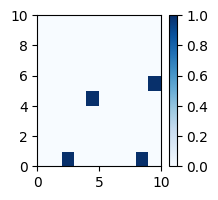

In [88]:
plt.figure(figsize=(2, 2))
frequencies = som.activation_response(X_train)
plt.pcolor(frequencies.T, cmap='Blues') 
plt.colorbar()
plt.show()

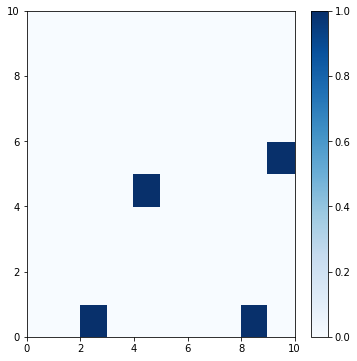

In [89]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(6, 6))

plt.pcolor(frequencies.T, cmap='Blues')  # plotting the distance map as background
plt.colorbar()

# Plotting the response for each pattern in the iris dataset
# different colors and markers for each label
markers = ['o', 's', 'D']
colors = ['C0', 'C1', 'C2']
for cnt, xx in enumerate(X_train):
    w = som.winner(xx)  # getting the winner
    # palce a marker on the winning position for the sample xx
    plt.plot(w[0]+.5, w[1]+.5, markerfacecolor='None',
             markeredgecolor=colors, markersize=12, markeredgewidth=2)

plt.show()

Como se puede observar, el algoritmo no es tan perciso como uno se puede imignar, mi punto de opinio seria intentar con otro algoritmo 